In [1]:
import sys
print(sys.version)

3.7.3 (default, Mar 27 2019, 16:54:48) 
[Clang 4.0.1 (tags/RELEASE_401/final)]


In [2]:
import cv2

import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd

import os, json, itertools

In [3]:
from classes.Image import Image
from classes.FilterSequence import FilterSequence

In [4]:
def plot(imagem):
    plt.figure(figsize=(30,12))
    plt.imshow(imagem, cmap="gray")
    plt.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)

In [5]:
os.getcwd()

'/Volumes/JULIO/alpr/projeto/code'

In [6]:
imagepath = '../../dataset/training/'
datapath = '../data/'

In [7]:
metadata = json.load(open(datapath+'metadata_db.json', 'r'))
metadata

{'training': {'track0034[09]': {'camera': 'Huawei P9 Lite',
   'position_vehicle': '347 490 341 257',
   'type': 'car',
   'make': 'JAC',
   'model': 'J2',
   'year': '2012',
   'plate': 'FGD-3938',
   'position_plate': '448 670 74 27',
   'char 1': '453 682 7 11',
   'char 2': '461 681 8 12',
   'char 3': '471 681 7 12',
   'char 4': '482 681 7 11',
   'char 5': '491 680 7 11',
   'char 6': '500 679 7 12',
   'char 7': '509 679 7 12'},
  'track0034[14]': {'camera': 'Huawei P9 Lite',
   'position_vehicle': '319 488 360 269',
   'type': 'car',
   'make': 'JAC',
   'model': 'J2',
   'year': '2012',
   'plate': 'FGD-3938',
   'position_plate': '425 677 77 29',
   'char 1': '429 690 9 12',
   'char 2': '439 689 8 13',
   'char 3': '449 689 8 12',
   'char 4': '461 689 7 11',
   'char 5': '470 688 8 12',
   'char 6': '479 687 8 13',
   'char 7': '489 687 7 12'},
  'track0034[21]': {'camera': 'Huawei P9 Lite',
   'position_vehicle': '266 496 389 283',
   'type': 'car',
   'make': 'JAC',
   '

In [8]:
imagens_originais = []
imagens_grayscale = []

arq_imagens = []
ext_imagens = []

for folder in os.listdir(imagepath):
    fpath = imagepath + folder + '/'
    cfolder = [c for c in os.listdir(fpath) if c.endswith("[01].png")]
    arq_imagens.extend([fpath + png for png in cfolder])
    ext_imagens.extend([nn.replace(".png", "") for nn in cfolder])

arq_imagens.sort()
ext_imagens.sort()
    
for i in range(len(arq_imagens)):
    aimg = arq_imagens[i]
    img = cv2.imread(aimg)
    imagens_originais.append(img)
    imagens_grayscale.append(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

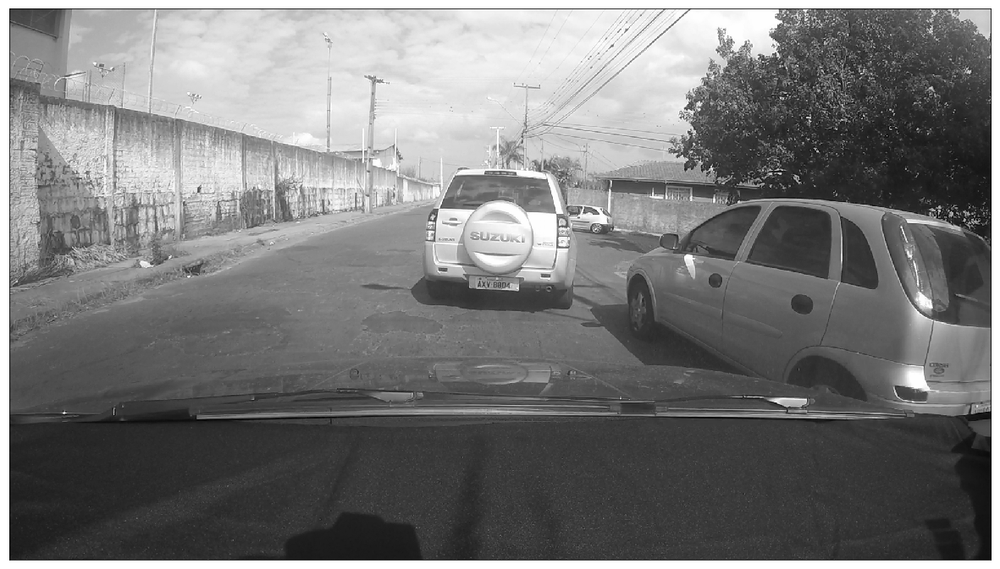

In [9]:
plot(imagens_grayscale[0])

### Usando Pipeline

In [10]:
teste = imagens_grayscale[0]

### Pipeline Real

In [11]:
ind = 1
real_seq = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]]
)
real_seq.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 8 })
real_seq.add_filter('equalize', {  })
real_seq.add_filter('canny', {
    'threshold1': 100, 'threshold2': 200, 'apertureSize': 3
})

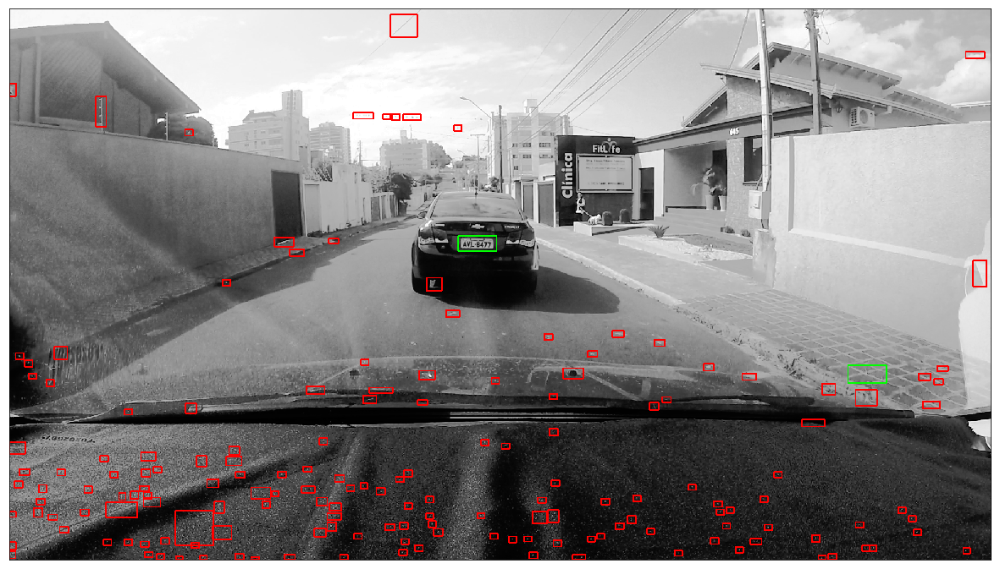

In [12]:
real_seq.apply_and_draw2(rectangle=(13, 9))
# real_seq.apply_and_draw(rectangle=(17,5))

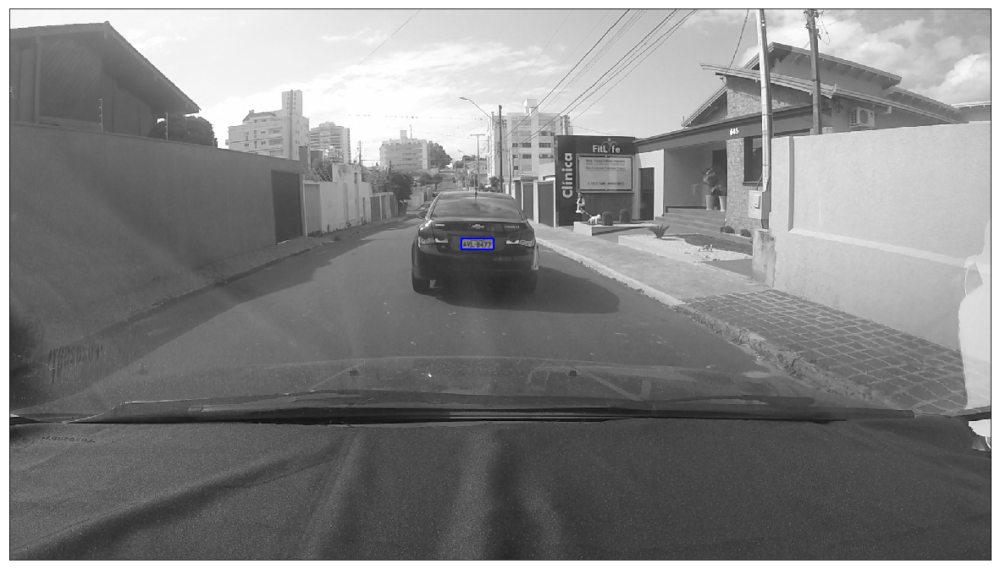

In [13]:
real_seq.image.draw_real_plate()

In [14]:
real_seq.image.score(full=True)

1323

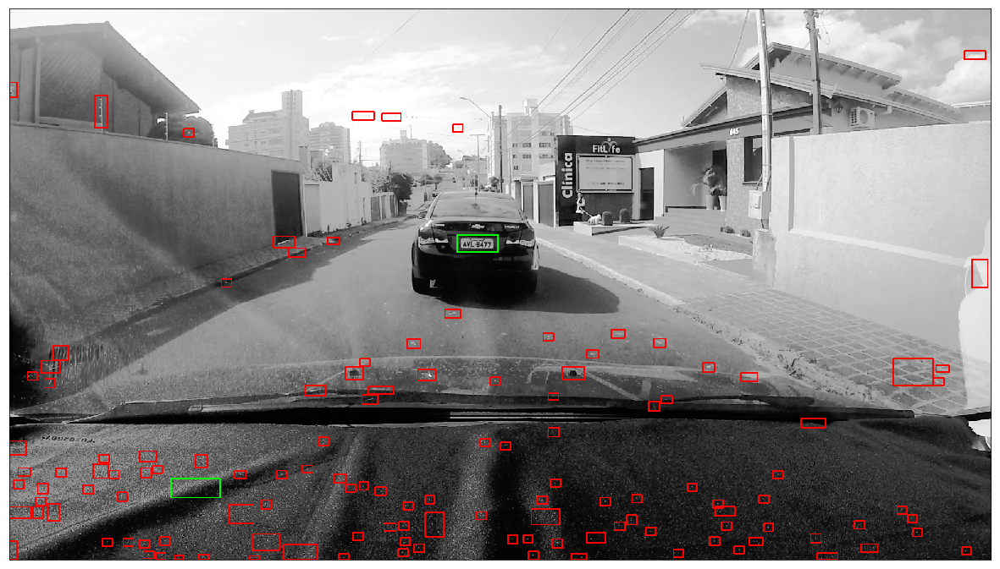

In [15]:
f1 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f1.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
f1.add_filter('equalize', {  })
f1.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f1.apply_and_draw2()

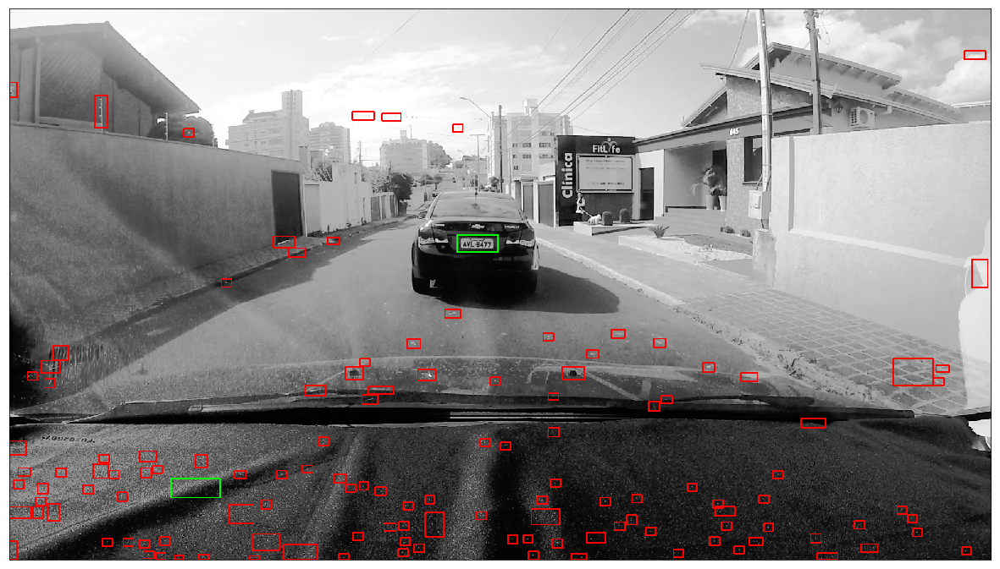

In [16]:
f2 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f2.add_filter('gaussian', { 'ksize': (5,5), 'sigmaX': 0 })
f2.add_filter('equalize', {  })
f2.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f2.apply_and_draw2()

In [17]:
f3 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f3.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 5 })
f3.add_filter('equalize', {  })
f3.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f3.apply_and_draw2(show = False)

In [18]:
f4 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f4.add_filter('gaussian', { 'ksize': (5,5), 'sigmaX': 5 })
f4.add_filter('equalize', {  })
f4.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f4.apply_and_draw2(show = False)

In [19]:
f5 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f5.add_filter('average', { 'ksize': (3,3) })
f5.add_filter('equalize', {  })
f5.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f5.apply_and_draw2(show = False)

In [20]:
f6 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f6.add_filter('average', { 'ksize': (5,5) })
f6.add_filter('equalize', {  })
f6.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f6.apply_and_draw2(show = False)

In [21]:
f7 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f7.add_filter('average', { 'ksize': (7,7) })
f7.add_filter('equalize', {  })
f7.add_filter('canny', { 'threshold1': 100, 'threshold2': 200, 'apertureSize': 3 })
f7.apply_and_draw2(show = False)

In [22]:
f8 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f8.add_filter('average', { 'ksize': (7,7) })
f8.add_filter('equalize', {  })
k1 = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
f8.add_filter('morph', { 'op': cv2.MORPH_GRADIENT, 'kernel': k1 })
f8.apply_and_draw2(show = False)

In [23]:
f9 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f9.add_filter('average', { 'ksize': (3,3) })
f9.add_filter('equalize', {  })
k2 = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
f9.add_filter('morph', { 'op': cv2.MORPH_GRADIENT, 'kernel': k2 })
f9.apply_and_draw2(show = False)

In [24]:
fA = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fA.add_filter('average', { 'ksize': (5,5) })
fA.add_filter('equalize', {  })
k3 = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
fA.add_filter('morph', { 'op': cv2.MORPH_GRADIENT, 'kernel': k3 })
fA.apply_and_draw2(show = False)

In [25]:
fB = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fB.add_filter('average', { 'ksize': (7,7) })
fB.add_filter('equalize', {  })
k4 = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
fB.add_filter('morph', { 'op': cv2.MORPH_GRADIENT, 'kernel': k4 })
fB.apply_and_draw2(show = False)

In [26]:
fC = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fC.add_filter('gaussian', { 'ksize': (5,5), 'sigmaX': 5 })
fC.add_filter('equalize', {  })
k5 = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
fC.add_filter('morph', { 'op': cv2.MORPH_GRADIENT, 'kernel': k5 })
fC.apply_and_draw2(show = False)

In [27]:
fD = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fD.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
fD.add_filter('equalize', {  })
fD.add_filter('canny', { 'threshold1': 100, 'threshold2': 300, 'apertureSize': 3 })
fD.apply_and_draw2(show = False)

In [28]:
fE = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fE.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
fE.add_filter('equalize', {  })
fE.add_filter('canny', { 'threshold1': 200, 'threshold2': 300, 'apertureSize': 3 })
fE.apply_and_draw2(show = False)

In [29]:
fE = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fE.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
fE.add_filter('equalize', {  })
fE.add_filter('canny', { 'threshold1': 100, 'threshold2': 300, 'apertureSize': 5 })
fE.apply_and_draw2(show = False)

In [30]:
fF = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
fF.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
fF.add_filter('equalize', {  })
fF.add_filter('canny', { 'threshold1': 50, 'threshold2': 200, 'apertureSize': 3 })
fF.apply_and_draw2(show = False)

In [31]:
f10 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f10.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
f10.add_filter('equalize', {  })
f10.add_filter('canny', { 'threshold1': 50, 'threshold2': 300, 'apertureSize': 5 })
f10.apply_and_draw2(show = False)

In [32]:
f11 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f11.add_filter('gaussian', { 'ksize': (5,5), 'sigmaX': 0 })
f11.add_filter('equalize', {  })
f11.add_filter('canny', { 'threshold1': 100, 'threshold2': 300, 'apertureSize': 3 })
f11.apply_and_draw2(show = False)

In [33]:
f12 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f12.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
f12.add_filter('equalize', {  })
f12.add_filter('canny', { 'threshold1': 150, 'threshold2': 250, 'apertureSize': 3 })
f12.apply_and_draw2(show = False)

In [34]:
f13 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f13.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
f13.add_filter('equalize', {  })
f13.add_filter('sobel', { 'ddepth': cv2.CV_64F, 'dx': 1, 'dy': 0, 'ksize': 3 })
f13.add_filter('threshold', {
    'thresh': 0, 'maxval': 255, 'type': cv2.THRESH_BINARY + cv2.THRESH_OTSU
})
f13.apply_and_draw2(show = False)

In [35]:
f14 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f14.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
f14.add_filter('equalize', {  })
f14.add_filter('sobel', { 'ddepth': cv2.CV_64F, 'dx': 1, 'dy': 0, 'ksize': 3 })
f14.add_filter('adaptive', {
    'maxValue': 255, 'adaptiveMethod': cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    'thresholdType': cv2.THRESH_BINARY, 'blockSize': 15, 'C': 2
})
f14.apply_and_draw2(show = False)

In [36]:
f15 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f15.add_filter('gaussian', { 'ksize': (5,5), 'sigmaX': 0 })
f15.add_filter('equalize', {  })
f15.add_filter('sobel', { 'ddepth': cv2.CV_64F, 'dx': 1, 'dy': 0, 'ksize': 3 })
f15.add_filter('threshold', {
    'thresh': 0, 'maxval': 255, 'type': cv2.THRESH_BINARY + cv2.THRESH_OTSU
})
f15.apply_and_draw2(show = False)

In [37]:
f16 = FilterSequence(
    imagens_grayscale[ind],
    name=ext_imagens[ind],
    metadata=metadata['training'][ext_imagens[ind]])
f16.add_filter('gaussian', { 'ksize': (3,3), 'sigmaX': 0 })
f16.add_filter('equalize', {  })
f16.add_filter('sobel', { 'ddepth': cv2.CV_64F, 'dx': 1, 'dy': 0, 'ksize': 3 })
f16.add_filter('adaptive', {
    'maxValue': 255, 'adaptiveMethod': cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    'thresholdType': cv2.THRESH_BINARY, 'blockSize': 15, 'C': 2
})
f16.apply_and_draw2(show = False)

In [38]:
from classes.PipelineStream import PipelineStream

In [39]:
# PipelineStream = None

In [40]:
pipe = PipelineStream(imagens_grayscale, ext_imagens, metadata)

In [41]:
# pipe.extend_filters([f1, f2, f3, f4, f5, f6, f7, f8, f9, fA, fB, fC, fD, fE, fF, f10, f11, f12, f13, f14, f15, f16])

In [42]:
# simplified
pipe.extend_filters([f1])

In [43]:
hold = pipe.score_filters(iou = True)

Executing 27300 combinations
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0010[01] 0.13513513513513514
track0011[01] 0.273989898989899
track0015[01] 0.6749526016431431
track0027[01] 0.8733870967741936
track0036[01] 0.7595238095238095
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0010[01] 0.15315315315315314
track0011[01] 0.2916666666666667
track0015[01] 0.6749526016431431
track0027[01] 0.8733870967741936
track0034[01] 0.0010069805763584913
track0036[01] 0.776984126984127
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.005989787902592302
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0010[01] 0.17017017017017017
track0011[01] 0.3194444444444444
track0015[01] 0.6749526016431431
track0027[01] 0.8733870967741936
track0034[01] 0.0010069805763584913
track0036[01] 0.8476190476190476
track0043[01] 0.7306159420289855
t

track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007613222280062467

Current Progress: 1000
CurrentScore: 0.14
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0010[01] 0.2752752752752753
track0011[01] 0.40711625982623084
track0013[01] 0.5537190082644629
track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007613222280062467
track0041[01]

track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007622750718460544
track0041[01] 0.0030488340679179146
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0058[01] 0.0010463196459761374
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.3946784922394678
track0010[01] 0.3333333333333333
track0011[01] 0.4556514913657771
track0013[01] 0.5537190082644629
track0014[01] 0.0013894705530092802
track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track

track0032[01] 0.002173320270778569
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007622750718460544
track0041[01] 0.0030488340679179146
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0058[01] 0.0010463196459761374
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.36537564162389174
track0011[01] 0.4757085020242915
track0013[01] 0.5537190082644629
track0014[01] 0.0013915631291433303
track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0022[01] 0.0021258353884231126
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007622750718460544

track0020[01] 0.0010340992833663865
track0021[01] 0.0031993131109641325
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010874413612349306
track0050[01] 0.2766362019260259
track0052[01] 0.0018751064003566195
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0058[01] 0.0010463196459761374
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.3887598699489085
track0011[01] 0.49514955537590943
track0013[01] 0.553719008264462

track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010473649203477419
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.4119278779472954
track0011[01] 0.5143856920684292
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.0031993131109641325
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002177829233995952
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.001543313837768319

track0011[01] 0.5337209302325582
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.0031993131109641325
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002177829233995952
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010484122852680896
track0002[01] 0.6137750653879

track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010494617470151047
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.43488265071329957
track0011[01] 0.5337209302325582
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.02064105701003181

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010494617470151047
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.4576271186440678
track0011[01] 0.5369024856596558
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.02064105701003181
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
trac

track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010494617470151047
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.47075208913649025
track0011[01] 0.54
track0013[01] 0.5537190082644629
track0014[01] 0.0013978788468247674
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.02064105701003181
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 5500
CurrentScore: 0.16
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004463820926600729
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
trac

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004463820926600729
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.4084911072

track0013[01] 0.5537190082644629
track0014[01] 0.0013978788468247674
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004463820926600729
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653

track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5246272028920018
track0011[01] 0.5459558823529411
track0013[01] 0.5537190082644629
track0014[01] 0.0013978788468247674
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289

track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.0044755988182276435
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5246272028920018
track0011[01] 0.5459558823529411
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
tr

track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5465587044534413
track0011[01] 0.5488203266787659
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.000667436

track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5682937751903269
track0011[01] 0.5516129032258065
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
tr

track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5682937751903269
track0011[01] 0.5516129032258065
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.0044301303351

track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002165982672138623
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368

track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002165982672138623
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5898350423539902
track0011[01] 0.5543362831858407
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 9500
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01]

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002165982672138623
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.611185086551265
track0011[01] 0.556993006993007
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021823569455011412
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179

track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.00448151110

track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6323464427750773
track0011[01] 0.5595854922279793
track0013[01] 0.5537190082644629
track0014[01] 0.001399996845077532

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0013584975485560402
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6323464427750773
track0011[01] 0.5595854922279793
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 11000
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track002

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014092232446514814
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6339130434782608
track0011[01] 0.5621160409556314
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.000809014346039513

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014092232446514814
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6339130434782608
track0011[01] 0.5621160409556314
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002131920795069361

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001414173677595222
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.4084911072

track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001414173677595222
track0046[01] 0.0010937882952499205
track0047[01] 0.004434274516946029
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505

track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6354300385109114
track0011[01] 0.5645868465430017
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.73061594202

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.636899747262005
track0011[01] 0.567
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0

track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.636899747262005
track0011[01] 0.567
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01]

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6383243467440896
track0011[01] 0.5693574958813838
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002131920795069361

track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.002033959199126151
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021701884637350087
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6383243467440896
track0011[01] 0.5693574958813838
track0013[01] 0.553719008264462

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.002037739792433077
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 14500
CurrentScore: 0.17
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687


track0009[01] 0.408491107286288
track0010[01] 0.6397058823529411
track0011[01] 0.5716612377850163
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.002037739792433077
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.0044384264593

track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6397058823529411
track0011[01] 0.5739130434782609
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.641046277665996
track0011[01] 0.5739130434782609
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.000809014346039513

track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.64104627

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.00448

track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6423473433782713
track0011[01] 0.5761146496815287
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.00155962362733

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6436107854630715
track0011[01] 0.5782677165354331
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365


track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6436107854630715
track0011[01] 0.5782677165354331
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.4084911

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6448382126348228
track0011[01] 0.5803738317757009
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141749333411

track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.0024292903001908728
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.0006731100831771746
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6448382126348228
track0011[01] 0.5824345146379045
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601643

track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6460311431826814
track0011[01] 0.5824345146379045
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.00243161943

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008548568947354138
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6460311431826814
track0011[01] 0.5825181445250868
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002133957013593

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.001403

track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008548568947354138
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.647191011235955
track0011[01] 0.5844512195121951
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6483191725157
track0011[01] 0.5864253393665159
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141749333411539

track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011628788208209973
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.40849

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6483191725157
track0011[01] 0.5883582089552238
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913


track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011628788208209973
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.00085

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.001041124414367517
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6494169096209913
track0011[01] 0.5883582089552238
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.87338709677419

track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6504854368932039
track0011[01] 0.5902511078286559
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.

track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6504854368932039
track0011[01] 0.5921052631578947
track0013[01] 0.5537190082

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214

Current Progress: 22500
CurrentScore: 0.13
MaxScore: 0.31
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6515259048970902
track0011[01] 0.5921052631578947
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[

track0010[01] 0.6515259048970902
track0011[01] 0.5931938807368092
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.00443842

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.0006

track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6525394045534151
track0011[01] 0.5954942837928715
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6527977044476327
track0011[01] 0.595702005730659
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.00369112795380

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.279

track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6535269709543569
track0011[01] 0.5985985

track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6535269709543569
track0011[01] 0.5985985985985987
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.00149378720322

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6535269709543569
track0011[01] 0.6016556291390729
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004442586184269264
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.0

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004442586184269264
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6556291390728477
track0011[01] 0.6016556291390729
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6587366694011485
track0011[01] 0.6046664475846204
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 26000
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[

track0011[01] 0.6046664475846204
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004446753713522799
track0049[01] 0.001164

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004446753713522799
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.61

track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.0206539941828

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

In [44]:
hold[1:]

(0.30688753269398433, (11, 9), (1400, 1500), (3, 5))

In [45]:
pipe2 = PipelineStream(imagens_grayscale, ext_imagens, metadata)
pipe2.extend_filters([f1, f3, f5, f7, f9, fB, fD, fF, f11, f13, f15])
hold2 = pipe2.score_filters(iou = True)

Executing 300300 combinations
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0010[01] 0.13513513513513514
track0011[01] 0.273989898989899
track0015[01] 0.6749526016431431
track0027[01] 0.8733870967741936
track0036[01] 0.7595238095238095
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0010[01] 0.15315315315315314
track0011[01] 0.2916666666666667
track0015[01] 0.6749526016431431
track0027[01] 0.8733870967741936
track0034[01] 0.0010069805763584913
track0036[01] 0.776984126984127
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.005989787902592302
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0010[01] 0.17017017017017017
track0011[01] 0.3194444444444444
track0015[01] 0.6749526016431431
track0027[01] 0.8733870967741936
track0034[01] 0.0010069805763584913
track0036[01] 0.8476190476190476
track0043[01] 0.7306159420289855


track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007613222280062467

Current Progress: 1000
CurrentScore: 0.14
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0010[01] 0.2752752752752753
track0011[01] 0.40711625982623084
track0013[01] 0.5537190082644629
track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007613222280062467
track0041[01]

track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007622750718460544
track0041[01] 0.0030488340679179146
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0058[01] 0.0010463196459761374
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.3946784922394678
track0010[01] 0.3333333333333333
track0011[01] 0.4556514913657771
track0013[01] 0.5537190082644629
track0014[01] 0.0013894705530092802
track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0034[01] 0.0010069805763584913
tr

track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007622750718460544
track0041[01] 0.0030488340679179146
track0043[01] 0.7306159420289855
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0058[01] 0.0010463196459761374
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.36537564162389174
track0011[01] 0.4757085020242915
track0013[01] 0.5537190082644629
track0014[01] 0.0013915631291433303
track0015[01] 0.6749526016431431
track0021[01] 0.0031993131109641325
track0022[01] 0.0021258353884231126
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007622750718460544
track0041[01] 0.003048834067917914

track0020[01] 0.0010340992833663865
track0021[01] 0.0031993131109641325
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002173320270778569
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010874413612349306
track0050[01] 0.2766362019260259
track0052[01] 0.0018751064003566195
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0058[01] 0.0010463196459761374
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.3887598699489085
track0011[01] 0.49514955537590943
track0013[01] 0.553719008264462

track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010473649203477419
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.4119278779472954
track0011[01] 0.5143856920684292
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.0031993131109641325
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002177829233995952
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.001543313837768319

track0011[01] 0.5337209302325582
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.0031993131109641325
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002177829233995952
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010484122852680896
track0002[01] 0.6137750653879

track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010494617470151047
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.43488265071329957
track0011[01] 0.5337209302325582
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.02064105701003181
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298

track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004457955196079571
track0058[01] 0.0010494617470151047
track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.4576271186440678
track0011[01] 0.5369024856596558
track0013[01] 0.5537190082644629
track0014[01] 0.0013936620177242402
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.02064105701003181
track0022[01] 0.0021278599935549442
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
trac

track0002[01] 0.6137750653879687
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.47075208913649025
track0011[01] 0.54
track0013[01] 0.5537190082644629
track0014[01] 0.0013978788468247674
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.02064105701003181
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.001089548805733448
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0

track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 5500
CurrentScore: 0.16
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004463820926600729
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track00

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004463820926600729
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5024965955515207
track0011[01] 0.5430167597765363
track0013[01] 0.5537190082644629
track0014[01] 0.001397878846824767

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004463820926600729
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857

track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5246272028920018
track0011[01] 0.5459558823529411
track0013[01] 0.5537190082644629
track0014[01] 0.0013978788468247674
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379

track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.0044755988182276435
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5246272028920018
track0011[01] 0.5459558823529411
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806

track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0050[01] 0.2791705354379449
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5465587044534413
track0011[01] 0.5488203266787659
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
tra

track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5465587044534413
track0011[01] 0.5488203266787659
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5682937751903269
track0011[01] 0.5516129032258065
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913


track0010[01] 0.5682937751903269
track0011[01] 0.5516129032258065
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198

track0030[01] 0.7677599088261365
track0032[01] 0.0021800907389118358
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002165982672138623
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5898350423539902
track0011[01] 0.5543362831858407
track0013[01] 0.5537190082644629
track0014[01] 0.00139999684507753

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002165982672138623
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.5898350423539902
track0011[01] 0.5543362831858407
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 9500
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.002129888458753757
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0

track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.611185086551265
track0011[01] 0.556993006993007
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.0021823569455011412
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015433138377683193
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515

track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6323464427750773
track0011[01] 0.5595854922279793
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0026[01] 0.001493787203222959

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6323464427750773
track0011[01] 0.5595854922279793
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 11000
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011539128925906646
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6339130434782608
track0011[01] 0.5621160409556314
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011539128925906646
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
t

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014092232446514814
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6339130434782608
track0011[01] 0.5621160409556314
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.000809014346039513

track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001414173677595222
track0046[01] 0.0010937882952499205
track0047[01] 0.00443013033515449
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6339130434782608
track0011[01] 0.56458684654300

track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001414173677595222
track0046[01] 0.0010937882952499205
track0047[01] 0.004434274516946029
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505

track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6354300385109114
track0011[01] 0.5645868465430017
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020320741581631055
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.73061594202

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.636899747262005
track0011[01] 0.567
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011575301743856196
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.636899747262005
track0011[01] 0.567
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01

track0032[01] 0.002184627868441309
track0033[01] 0.002033959199126151
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.002168083528270668
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6383243467440896
track0011[01] 0.5693574958813838
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.002033959199126151
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.0044815

track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6397058823529411
track0011[01] 0.5716612377850163
track0013[01] 0.5537190082644629
track0014[01] 0.0013999968450775322
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.002037739792433077
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 14500
CurrentScore: 0.17
MaxScore: 0.31
track004

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6397058823529411
track0011[01] 0.5716612377850163
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365


track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6397058823529411
track0011[01] 0.5739130434782609
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.00080901434603951

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.001415831559983962
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.40849110

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.2000

track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6423473433782713
track0011[01] 0.5761146496815287
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021319207950693617
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.00155962362733

track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6423473433782713
track0011[01] 0.5761146496815287
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.00276894791055190

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6436107854630715
track0011[01] 0.5782677165354331
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937

track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6436107854630715
track0011[01] 0.5782677165354331
track0013[01] 0.5537190082644

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.00448

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.0006731100831771746
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6448382126348228
track0011[01] 0.5803738317757009
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.003691127953

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.0024292903001908728
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.0006731100831771746
track0005[01] 0.0006674368354825988
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6448382126348228
track0011[01] 0.5824345

track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008548568947354138
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6460311431826814
track0011[01] 0.5824345146379045
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008548568947354138
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6460311431826814
track0011[01] 0.5825181445250868
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.67495260164314

track0005[01] 0.0008548568947354138
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.647191011235955
track0011[01] 0.5844512195121951
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.730615942028

track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008548568947354138
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.647191011235955
track0011[01] 0.5844512195121951
track0013[01] 0.5537190082644629
track0014[01] 0.001402121271246

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6483191725157
track0011[01] 0.5864253393665159
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917914

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011628788208209973
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.613

track0049[01] 0.0011628788208209973
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.001876880389382501
track0053[01] 0.008241552198059752
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6483191725157
track0011[01] 0.5883582089552238
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068


track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011628788208209973
track0050[01] 0.2791705354379449
track0051[01] 0.001

track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.001041124414367517
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.527

track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.001041124414367517
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0021765278652843808
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6504854368932039
track0011[01] 0.5902511078286559
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.00115874098000

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6504854368932039
track0011[01] 0.5902511078286559
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.

track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014174933341153987
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214

Current Progress: 22500
CurrentScore: 0.13
MaxScore: 0.31
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6515259048970902


track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6515259048970902
track0011[01] 0.5931938807368092
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6525394045534151
track0011[01] 0.5939218523878437
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.

track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6527977044476327
track0011[01] 0.5957020

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034389140271493214
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6535269709543569
track0011[01] 0.595702005730659
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021339570135937833
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.87338709677419

track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6535269709543569
track0011[01] 0.5985985985985987
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004438426459377626
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.0006

track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004442586184269264
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6535269709543569
track0011[01] 0.6016556291390729
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.000809014346039

track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6556291390728477
track0011[01] 0.6016556291390729
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.002135997125461464
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004442586184269264
track0049[01] 0.0011642681623034597
track0050[01] 0.2791

track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004442586184269264
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.00

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004446753713522799
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6587366694011485
track0011[01] 0.6046664475846204
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6587366694011485
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.00100698057635849

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.002431619437583194
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.279

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.76775990882613

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633

Current Progress

track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.553719008

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.00203963536433301

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.27

track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 31000
CurrentScore: 0.17
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.001409685725

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.27

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.00

track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.661

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.00

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 37000
CurrentScore: 0.17
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.279170535437

track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.661

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741

track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.001559623627

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 39500
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.279170535437

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460

track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.853566009104

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.0024857928894

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601

track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.0024857928894

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.00203963536433301

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 45500
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.00

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.00100698057635849

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5

track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633

Current Progress: 48000
CurrentScore: 0.13
MaxScore: 0.31
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[

track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.00109378829

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601

track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.0024857928894

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.76775990882613

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633

Current Progress: 54000
CurrentScore: 0.13
MaxScore: 0.31
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
tr

track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.0024857928894

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0

track0037[01] 0.0007632303037656609

Current Progress: 56500
CurrentScore: 0.17
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
tr

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.27

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 62500
CurrentScore: 0.17
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466


track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.00109378829

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 65000
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466


track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.00243629113

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.674952601

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.00141915901370

track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.001402121271

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.00

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 71000
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.00

track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.661

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.00

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633

Current Progress: 73500
CurrentScore: 0.13
MaxScore: 0.31
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.00

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538

track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.27

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520

track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538

track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.0044593

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.001402121271

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519

track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.003048834067917

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.00100698057635849

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.00116

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520

track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.00100698057635849

track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609

Current Progress: 82000
CurrentScore: 0.17
MaxScore: 0.31
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.00109378829524992

track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000

track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.001034099283

track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.00218462786844130

track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.00243629113

track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004

track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.001402121271

track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519

track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865

Current Progress: 84500
CurrentScore: 0.20
MaxScore: 0.31
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
trac

track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0

track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.0007632303037656609
track0041[01] 0.0030488340679179146
track0042[01] 0.0015596236273352235
track0043[01] 0.7306159420289855
track0044[01] 0.0014191590137089538
track0045[01] 0.0024362911367908466
track0046[01] 0.0010937882952499205
track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.

track0047[01] 0.004459303347709599
track0049[01] 0.0011642681623034597
track0050[01] 0.2791705354379449
track0051[01] 0.0014039855072463768
track0052[01] 0.0018786577382360829
track0053[01] 0.008241552198059752
track0054[01] 0.0010424979294260492
track0055[01] 0.200045759609518
track0057[01] 0.004481511102003373
track0058[01] 0.0010505133118918733
track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.0014937872032

track0060[01] 0.0034442128160971633
track0002[01] 0.6137750653879687
track0004[01] 0.000674648620510151
track0005[01] 0.0008558709598537239
track0007[01] 0.5273749630068068
track0008[01] 0.0014096857258900836
track0009[01] 0.408491107286288
track0010[01] 0.6617886178861788
track0011[01] 0.6076320939334638
track0013[01] 0.5537190082644629
track0014[01] 0.0014021212712460869
track0015[01] 0.6749526016431431
track0020[01] 0.0010340992833663865
track0021[01] 0.020653994182801068
track0022[01] 0.0021380411418494656
track0023[01] 0.1742323520101298
track0024[01] 0.0008090143460395136
track0025[01] 0.0011587409800073618
track0026[01] 0.001493787203222959
track0027[01] 0.8733870967741936
track0028[01] 0.0027689479105519068
track0029[01] 0.002485792889438077
track0030[01] 0.7677599088261365
track0032[01] 0.002184627868441309
track0033[01] 0.0020396353643330144
track0034[01] 0.0010069805763584913
track0035[01] 0.0036911279538052806
track0036[01] 0.8535660091047041
track0037[01] 0.000763230303765

KeyboardInterrupt: 

In [ ]:
hold2[1:]

In [ ]:

hold[0].filter_sequence

In [ ]:
hold[1]

In [ ]:
best_filter = hold[0]

In [ ]:
indice = 11
img_name = ext_imagens[indice]
best_filter.image = Image(imagens_grayscale[indice], name=img_name, metadata=metadata['training'][img_name])
best_filter.apply_and_draw2()